In [1]:
import os
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F

In [2]:
from torch.utils.data import DataLoader
from torch.utils.data import random_split

import torchvision.transforms as transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid

from torchsummary import summary

# Constants

In [3]:
latent_dims = 10
num_epochs = 70
variational_beta = 1
batch_size = 128
capacity = 64
learning_rate = 1e-4

# Load Dataset

In [4]:
img_transforms = transforms.Compose([
    transforms.ToTensor()
])

dataset = MNIST(root='data/', train=True, 
                transform=img_transforms, download=True)

# Training validation & test dataset
train_ds, val_ds = random_split(dataset, [50000, 10000])

test_ds = MNIST(root='data/', train=False, 
                transform=transforms.ToTensor())


# Dataloaders
train_loader = DataLoader(train_ds, batch_size, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_ds, batch_size*2, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_ds, batch_size*2, num_workers=4, pin_memory=True)

# Move Data and model to device

In [5]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else: 
        return torch.device('cpu')

In [6]:
device = get_default_device()
device

device(type='cuda')

In [7]:
def to_device(data, device):
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [8]:
class DeviceDataLoader():

    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        for b in self.dl:
            yield to_device(b, self.device)
    
    def __len__(self):
        return len(self.dl)

In [9]:
train_loader = DeviceDataLoader(train_loader, device)
val_loader = DeviceDataLoader(val_loader, device)
test_loader = DeviceDataLoader(test_loader, device)

## VAE

In [10]:
class Encoder(nn.Module):
    
    def __init__(self):
        super().__init__() 
        c = capacity
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=c, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(in_channels=c, out_channels=c, kernel_size=4, stride=2, padding=1)
        self.conv3 = nn.Conv2d(in_channels=c, out_channels=c, kernel_size=4, stride=2, padding=1)

        self.fc_1 = nn.Linear(in_features=c*3*3, out_features=50)
        
        self.softplus_operation = nn.Softplus()
        
        self.fc_mu = nn.Linear(in_features=50, out_features=latent_dims)
        self.fc_logvar = nn.Linear(in_features=50, out_features=latent_dims)

    def forward(self, xb):
        xb = F.relu(self.conv1(xb))
        xb = F.relu(self.conv2(xb))
        xb = F.relu(self.conv3(xb))

        xb = xb.view(xb.size(0), -1)

        xb = F.relu(self.fc_1(xb))
        
        x_mu = self.fc_mu(xb)
        x_logvar = self.softplus_operation(self.fc_logvar(xb))
        
        return x_mu, x_logvar
        

class Decoder(nn.Module):
    
    def __init__(self):
        super().__init__() 
        c = capacity
        self.fc_2 = nn.Linear(in_features=latent_dims, out_features=50)
        self.fc_1 = nn.Linear(in_features=50, out_features=c*3*3)


        self.conv3 = nn.ConvTranspose2d(in_channels=c, out_channels=c, kernel_size=4, stride=2, padding=1, output_padding=1)
        self.conv2 = nn.ConvTranspose2d(in_channels=c, out_channels=c, kernel_size=4, stride=2, padding=1)
        self.conv1 = nn.ConvTranspose2d(in_channels=c, out_channels=1, kernel_size=4, stride=2, padding=1)
        # self.conv1 = nn.ConvTranspose2d(in_channels=c, out_channels=c//4, kernel_size=4, stride=2, padding=1)

        # self.fc_penultimate = nn.Linear(in_features=c//4*28*28, out_features=28*28)
        # self.fc_final = nn.Linear(in_features=28*28, out_features=28*28)
            
    def forward(self, xb):
        xb = F.relu(self.fc_2(xb))
        xb = F.relu(self.fc_1(xb))

        xb = xb.view(xb.size(0), capacity, 3, 3)

        xb = F.relu(self.conv3(xb))
        xb = F.relu(self.conv2(xb))
        xb = torch.sigmoid(self.conv1(xb))
        
        # xb = xb.view(xb.size(0), -1)
        
        # xb = self.fc_penultimate(xb)
        # xb = torch.sigmoid(self.fc_final(xb))
        # xb = xb.view(xb.size(0), 1, 28, 28)
        return xb
    
def vae_loss(reconstruct, og, mu, logvar):
    reconstruction_loss = F.binary_cross_entropy(reconstruct.view(-1, 784), og.view(-1, 784), reduction='sum')
    # kl_divergence = 0.5 * torch.sum(torch.exp(logvar) + torch.square(mu) - 1 - logvar)
    kl_divergence = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return reconstruction_loss + variational_beta * kl_divergence
    

class VariationalAutoEncoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()
        
    def latent_sample(self, mu, logvar):
        sigma = torch.mul(logvar, 0.5)
        eps = torch.randn_like(sigma)
        sample = mu + (sigma * eps)
        return sample
    
    def forward(self, xb):
        latent_mu, latent_std = self.encoder(xb)
        latent_ = self.latent_sample(latent_mu, latent_std)
        reconstruction = self.decoder(latent_)
        return reconstruction, latent_mu, latent_std
    
    def train_step(self, input_batch):
        # input_batch, _ = batch # 1
        input_batch_reconstruct, batch_mu, batch_std = self(input_batch)
        loss = vae_loss(input_batch_reconstruct, input_batch, batch_mu, batch_std)
        return {"loss": loss}
    
    def valid_step(self, batch):
        with torch.no_grad():
            val_batch, _ = batch # #2 either unpack before or afterwards, both work
            val_batch_reconstruct, batch_mu, batch_std = self(val_batch)
            loss = vae_loss(val_batch_reconstruct, val_batch, batch_mu, batch_std)
            
        return {"val_loss": loss}

    def get_metrics_epoch_end(self, outputs, validation=True):
        if validation:
            loss_ = 'val_loss'
        else:
            loss_ = 'loss'
            
        batch_losses = [x[f'{loss_}'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   
        return {f'{loss_}': epoch_loss.item()}

    def epoch_end(self, epoch, result):
        print(f"Epoch [{epoch+1}] -> loss: {result['loss']:.4f}, val_loss: {result['val_loss']:.4f}")

In [11]:
# summary(to_device(Encoder(), device), (1, 28, 28))
# summary(to_device(Decoder(), device), (1, latent_dims))
# summary(VariationalAutoEncoder(), (1, 28, 28))

# Train and Test

In [12]:
!rm -rf /content/images
!rm -rf /content/generated

In [13]:
##@title Visualization
import os
import cv2
from copy import deepcopy

def visualize_reconstruction(model, batch_images, iter_num, save_dir="./images"):
    
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    
    with torch.no_grad():
        recons_images, _, _ = model(batch_images)
        img_ = make_grid(recons_images[:50].cpu().detach().clamp(0.0, 1.0) * 255.0, nrow=10).permute((1, 2, 0)).numpy()
        cv2.imwrite(os.path.join(save_dir, f"Image_{iter_num:04}.png"), img_)

def generate_images(model, latent_vectors, iter_num, save_dir="./generated"):

    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    with torch.no_grad():
        # model.to("cpu")
        img_generated = model.decoder(latent_vectors)

        img_ = make_grid(img_generated[:100].cpu().detach().clamp(0.0, 1.0) * 255.0, nrow=10).permute((1, 2, 0)).numpy()
        cv2.imwrite(os.path.join(save_dir, f"Image_{iter_num:04}.png"), img_)
        # model.to(device)

In [14]:
##@title temp#
# for visualizing reconstruction
for test_batch in test_loader:
    test_images, _ = test_batch
    break


# for generating new images

# latents = torch.nn.init.normal_(torch.FloatTensor(50, latent_dims), mean=0.0, std=1.0)
# latents = to_device(torch.FloatTensor(100, latent_dims).normal_(0.0, 2.0), device)
latents = torch.randn(128, latent_dims, device=device)

# to_device(latents, device)

In [15]:
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.valid_step(batch) for batch in val_loader]
    return model.get_metrics_epoch_end(outputs, validation=True)

In [16]:
def fit(epochs, lr, model, train_loader, val_loader, opt_func=None):
    history = []
    
    if not opt_func:
        optimizer = torch.optim.SGD(model.parameters(), lr)
    else:
        optimizer = opt_func

    
    # scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer=optimizer, max_lr=0.01,
    #                                                 epochs=epochs, 
    #                                                 steps_per_epoch=len(train_loader))
    

    for epoch in range(epochs):
        # Training Phase 
        train_history = []
        
        # new image generation
        generate_images(model, latents, epoch)

        model.train()
        
        for train_images, _  in train_loader:
            info = model.train_step(train_images)
            loss = info['loss']
        
            # contains batch loss for training phase
            train_history.append(info)
            
            loss.backward()

            # nn.utils.clip_grad_value_(model.parameters(), 0.1)

            optimizer.step()
            optimizer.zero_grad()
            # scheduler.step()

        train_result = model.get_metrics_epoch_end(train_history, validation=False)
        val_result = evaluate(model, val_loader)
        result = {**train_result, **val_result}

        visualize_reconstruction(model, test_images, epoch+1)

        model.epoch_end(epoch, result)
        history.append(result)

    return history

In [17]:
model = VariationalAutoEncoder()
to_device(model, device)
summary(model, (1, 28, 28))
# num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
# print('Number of parameters: %d' % num_params)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 14, 14]           1,088
            Conv2d-2             [-1, 64, 7, 7]          65,600
            Conv2d-3             [-1, 64, 3, 3]          65,600
            Linear-4                   [-1, 50]          28,850
            Linear-5                    [-1, 2]             102
            Linear-6                    [-1, 2]             102
          Softplus-7                    [-1, 2]               0
           Encoder-8         [[-1, 2], [-1, 2]]               0
            Linear-9                   [-1, 50]             150
           Linear-10                  [-1, 576]          29,376
  ConvTranspose2d-11             [-1, 64, 7, 7]          65,600
  ConvTranspose2d-12           [-1, 64, 14, 14]          65,600
  ConvTranspose2d-13            [-1, 1, 28, 28]           1,025
          Decoder-14            [-1, 1,

In [18]:
history = [evaluate(model, val_loader)]
history

[{'val_loss': 149517.875}]

In [19]:
optimizer = torch.optim.Adam(params=model.parameters(), lr=learning_rate, weight_decay=1e-5)

In [20]:
history = fit(num_epochs, learning_rate, model, train_loader, val_loader, optimizer)

Epoch [1] -> loss: 35049.3789, val_loss: 49722.7266
Epoch [2] -> loss: 23521.7285, val_loss: 43845.0820
Epoch [3] -> loss: 21855.9902, val_loss: 42074.4258
Epoch [4] -> loss: 21092.5195, val_loss: 40807.6641
Epoch [5] -> loss: 20538.0938, val_loss: 39973.7969
Epoch [6] -> loss: 20166.1230, val_loss: 39367.7617
Epoch [7] -> loss: 19867.1230, val_loss: 38815.2500
Epoch [8] -> loss: 19636.4766, val_loss: 38411.1680
Epoch [9] -> loss: 19461.5195, val_loss: 38117.3516
Epoch [10] -> loss: 19317.6875, val_loss: 37954.4570
Epoch [11] -> loss: 19198.2871, val_loss: 37732.9531
Epoch [12] -> loss: 19092.8789, val_loss: 37548.4805
Epoch [13] -> loss: 18995.2246, val_loss: 37355.5703
Epoch [14] -> loss: 18910.2070, val_loss: 37209.4297
Epoch [15] -> loss: 18834.1797, val_loss: 37066.2188
Epoch [16] -> loss: 18762.5156, val_loss: 36916.0039
Epoch [17] -> loss: 18691.1270, val_loss: 36735.6641
Epoch [18] -> loss: 18634.4238, val_loss: 36713.8359
Epoch [19] -> loss: 18577.0938, val_loss: 36569.9688
Ep

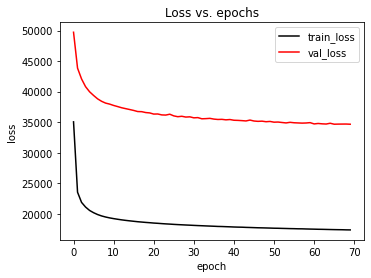

In [21]:
train_losses = [r['loss'] for r in history]
val_losses = [r['val_loss'] for r in history]

plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(train_losses, c='k', label="train_loss")
plt.plot(val_losses, c='r', label="val_loss")
plt.legend()
plt.xlabel('epoch')
plt.ylabel('loss')
_ = plt.title('Loss vs. epochs')

In [22]:
torch.save(model, f"./vae_{latent_dims}.pt")

# Evaluating on test set

images.shape: torch.Size([256, 1, 28, 28])


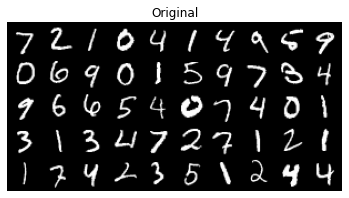

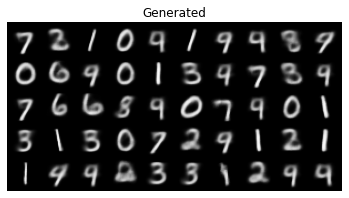

In [23]:
import numpy as np
import matplotlib.pyplot as plt

model.to("cpu")
model.eval()

for og_batch, _ in test_loader:
    og_batch = to_device(og_batch, "cpu")
    print('images.shape:', og_batch.shape)
    plt.figure()
    plt.axis("off")
    plt.title("Original")
    plt.imshow(make_grid(og_batch[:50], nrow=10).permute((1, 2, 0))) # move the channel dimension    

    plt.figure()
    plt.axis("off")
    
    images, _, _ = model(og_batch)
    plt.axis("off")
    plt.title("Generated")
    plt.imshow(make_grid(images[:50], nrow=10).permute((1, 2, 0)).detach().numpy())
    break

plt.show()

In [24]:
import imageio
import numpy as np
import glob
from PIL import Image 
from numpy import asarray
import IPython.display as dsip

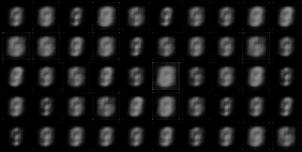

In [25]:
reconstruct_file = './reconstruction.gif'


filenames = glob.glob('/content/images/*.png')
filenames = sorted(filenames)
imgs = [asarray(Image.open(img)) for img in filenames]
imageio.mimsave(reconstruct_file, imgs)

with open(reconstruct_file,'rb') as file:
    dsip.display(dsip.Image(file.read()))

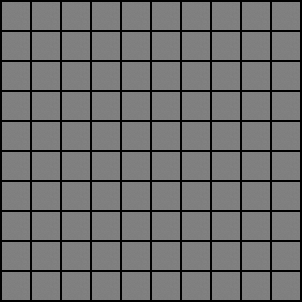

In [26]:
generated_file = './generation.gif'


filenames = glob.glob('/content/generated/*.png')
filenames = sorted(filenames)
imgs = [asarray(Image.open(img)) for img in filenames]
imageio.mimsave(reconstruct_file, imgs)

with open(generated_file,'rb') as file:
    dsip.display(dsip.Image(file.read()))

# Interpolation

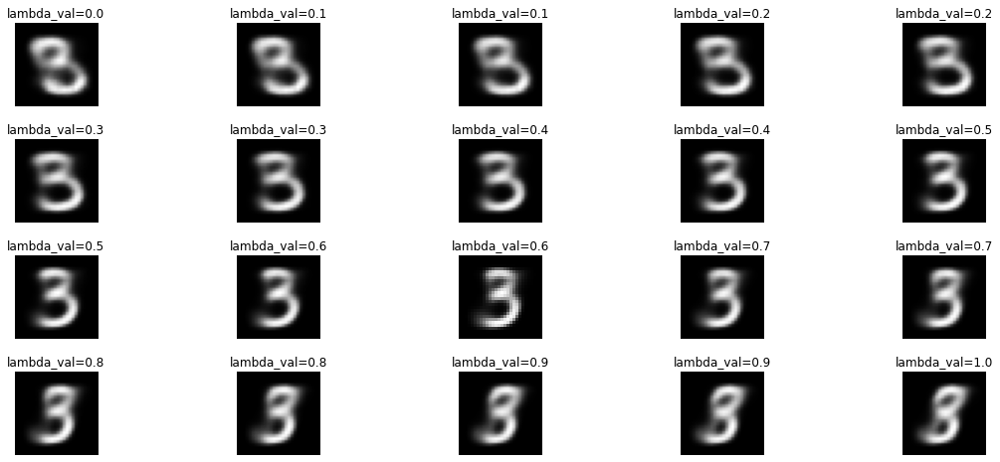

In [27]:
model.eval()
to_device(model, device)

def interpolation(lambda1, model, img1, img2):
    
    with torch.no_grad():
    
        # latent vector of first image
        img1 = to_device(img1, device)
        latent_1, _ = model.encoder(img1)

        # latent vector of second image
        img2 = to_device(img2, device)
        latent_2, _ = model.encoder(img2)

        # interpolation of the two latent vectors
        inter_latent = lambda1* latent_1 + (1- lambda1) * latent_2

        # reconstruct interpolated image
        inter_image = model.decoder(inter_latent)
        inter_image = inter_image.cpu()

        return inter_image
    
# sort part of test set by digit
digits = [[] for _ in range(10)]
for img_batch, label_batch in test_loader:
    for i in range(img_batch.size(0)):
        digits[label_batch[i]].append(img_batch[i:i+1])
    if sum(len(d) for d in digits) >= 1000:
        break;

# interpolation lambdas
lambda_range=np.linspace(0,1,20)

fig, axs = plt.subplots(4,5, figsize=(20, 8))
fig.subplots_adjust(hspace = .4, wspace=.0001)
axs = axs.ravel()

for ind,l in enumerate(lambda_range):
    inter_image=interpolation(float(l), model, to_device(digits[8][0], device), to_device(digits[3][0], device))
   
    inter_image = inter_image.clamp(0, 1)
    
    image = inter_image.numpy()
    axs[ind].axis("off")
    axs[ind].imshow(image[0,0,:,:], cmap='gray')
    axs[ind].set_title('lambda_val='+str(round(l,1)))


plt.show() 

# Random generation

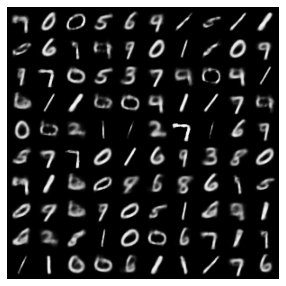

In [28]:
model.eval()

with torch.no_grad():

    # sample latent vectors from the normal distribution
    latent = torch.randn(128, latent_dims, device=device)

    # reconstruct images from the latent vectors
    img_recon = model.decoder(latent)
    # img_recon = img_recon.cpu()

    fig, ax = plt.subplots(figsize=(5, 5))
    # plt.imshow(make_grid(img_recon.data[:100].cpu().detach(),10,5))
    plt.axis("off")
    plt.imshow(make_grid(img_recon.data[:100].cpu().detach().clamp(0.0, 1.0), nrow=10).permute((1, 2, 0)).numpy())
    plt.show()

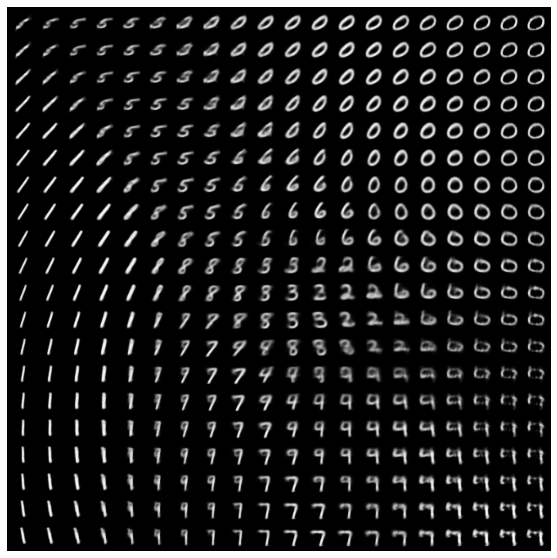

In [29]:
# load a network that was trained with a 2d latent space
if latent_dims != 2:
    print('Please change the parameters to two latent dimensions.')
    
with torch.no_grad():
    
    # create a sample grid in 2d latent space
    latent_x = np.linspace(-1.5,1.5,20)
    latent_y = np.linspace(-1.5,1.5,20)
    latents = torch.FloatTensor(len(latent_y), len(latent_x), 2)
    for i, lx in enumerate(latent_x):
        for j, ly in enumerate(latent_y):
            latents[j, i, 0] = lx
            latents[j, i, 1] = ly
    latents = latents.view(-1, 2) # flatten grid into a batch

    # reconstruct images from the latent vectors
    latents = latents.to(device)
    image_recon = model.decoder(latents)
    image_recon = image_recon.cpu()

    fig, ax = plt.subplots(figsize=(10, 10))
    plt.axis("off")
    plt.imshow(make_grid(image_recon.data[:400].cpu().detach(),20,5).permute((1, 2, 0)))
    plt.show()